In [19]:
%load_ext autoreload
%autoreload 2

from pathlib import Path

from hloc import (
    extract_features,
    match_features,
    reconstruction,
    visualization,
    pairs_from_retrieval,
)
from hloc.utils import viz_3d

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Setup
In this notebook, we will run SfM reconstruction from scratch on a set of images. We choose the [South-Building dataset](https://openaccess.thecvf.com/content_cvpr_2013/html/Hane_Joint_3D_Scene_2013_CVPR_paper.html) - we will download it later. First, we define some paths.

In [7]:
images = Path("/data/grenoble/images/db")
# images = Path("/data/South-Building/images/")

outputs = Path("/data/outputs/grenoble_sfm/")
sfm_pairs = outputs / "pairs-netvlad.txt"
sfm_dir = outputs / "sfm_superpoint+superglue"

retrieval_conf = extract_features.confs["senet"]
feature_conf = extract_features.confs["disk"]
matcher_conf = match_features.confs["disk+lightglue"]

## Download the dataset
The dataset is simply a set of images. The intrinsic parameters will be extracted from the EXIF data and refined with SfM.

In [8]:
#if not images.exists():
#    !wget https://cvg-data.inf.ethz.ch/local-feature-evaluation-schoenberger2017/South-Building.zip -P data/
#    !unzip -q data/South-Building.zip -d data/

## Find image pairs via image retrieval
We extract global descriptors with NetVLAD and find for each image the most similar ones. For smaller dataset we can instead use exhaustive matching via `hloc/pairs_from_exhaustive.py`, which would find $\frac{n(n-1)}{2}$ images pairs.

In [10]:
retrieval_path = extract_features.main(retrieval_conf, images, outputs)
pairs = pairs_from_retrieval.main(retrieval_path, sfm_pairs, num_matched=5)

[2024/02/08 11:21:40 hloc INFO] Extracting local features with configuration:
{'model': {'model_name': 'SENet_R50_con',
           'name': 'senet',
           'resnet_size': 50,
           'scale_list': [0.7071, 1.0, 1.4142]},
 'output': 'global-feats-senet',
 'preprocessing': {'resize_max': 1024}}
[2024/02/08 11:21:40 hloc INFO] Found 24 images in root /data/grenoble/images/db.
[2024/02/08 11:21:40 hloc INFO] Skipping the extraction.
[2024/02/08 11:21:40 hloc INFO] Extracting image pairs from a retrieval database.
[2024/02/08 11:21:40 hloc INFO] Found 120 pairs.


## Extract and match local features

In [11]:
feature_path = extract_features.main(feature_conf, images, outputs)
match_path = match_features.main(
    matcher_conf, sfm_pairs, feature_conf["output"], outputs
)

[2024/02/08 11:21:59 hloc INFO] Extracting local features with configuration:
{'model': {'max_keypoints': 5000, 'name': 'disk'},
 'output': 'feats-disk',
 'preprocessing': {'grayscale': False, 'resize_max': 1600}}
[2024/02/08 11:21:59 hloc INFO] Found 24 images in root /data/grenoble/images/db.
100%|██████████████████████████████████████████████████████████| 24/24 [00:04<00:00,  5.10it/s]
[2024/02/08 11:22:04 hloc INFO] Finished exporting features.
[2024/02/08 11:22:04 hloc INFO] Matching local features with configuration:
{'model': {'features': 'disk', 'name': 'lightglue'},
 'output': 'matches-disk-lightglue'}
Downloading: "https://github.com/cvg/LightGlue/releases/download/v0.1_arxiv/disk_lightglue.pth" to /root/.cache/torch/hub/checkpoints/disk_lightglue_v0-1_arxiv.pth
100%|█████████████████████████████████████████████████████| 45.4M/45.4M [00:00<00:00, 98.3MB/s]
100%|██████████████████████████████████████████████████████████| 72/72 [00:03<00:00, 20.19it/s]
[2024/02/08 11:22:10 hloc

## 3D reconstruction
Run COLMAP on the features and matches.

In [13]:
model = reconstruction.main(sfm_dir, images, sfm_pairs, feature_path, match_path)

[2024/02/08 11:22:56 hloc WARNING] The database already exists, deleting it.
[2024/02/08 11:22:56 hloc INFO] Creating an empty database...
[2024/02/08 11:22:56 hloc INFO] Importing images into the database...
[2024/02/08 11:22:58 hloc INFO] Importing features into the database...
100%|████████████████████████████████████████████████████████| 24/24 [00:00<00:00, 2456.76it/s]
[2024/02/08 11:22:58 hloc INFO] Importing matches into the database...
100%|██████████████████████████████████████████████████████| 120/120 [00:00<00:00, 3937.79it/s]
[2024/02/08 11:22:58 hloc INFO] Performing geometric verification of the matches...
I20240208 11:22:58.268752 395253 misc.cc:198] 
Custom feature matching
I20240208 11:22:58.270684 395253 feature_matching.cc:1021] Matching block [1/1]
I20240208 11:22:59.117228 395253 feature_matching.cc:46]  in 0.847s
I20240208 11:22:59.123018 395253 timer.cc:91] Elapsed time: 0.014 [minutes]
[2024/02/08 11:22:59 hloc INFO] Running 3D reconstruction...
I20240208 11:22:

In [21]:
model

Reconstruction(num_reg_images=24, num_cameras=1, num_points3D=15389, num_observations=51214)

## Visualization
We visualize some of the registered images, and color their keypoint by visibility, track length, or triangulated depth.

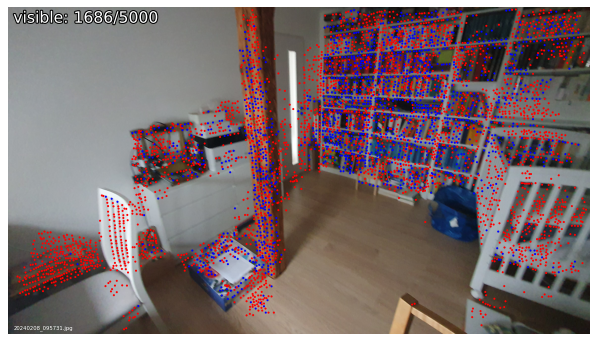

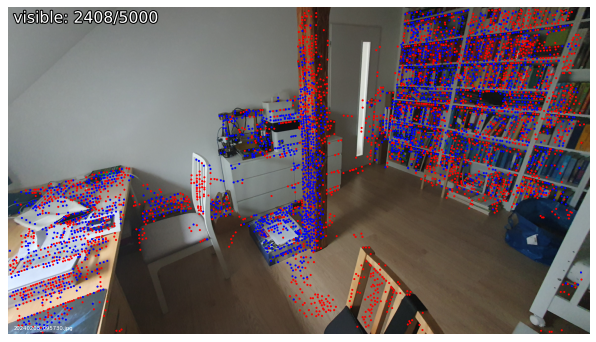

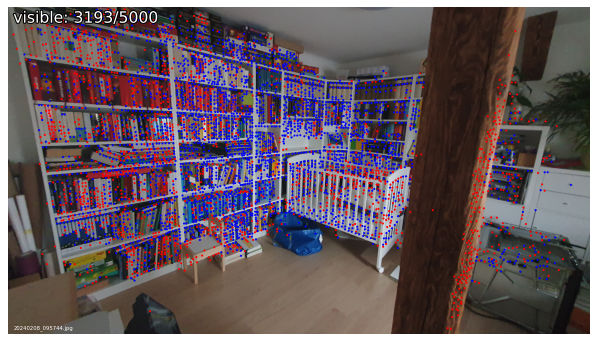

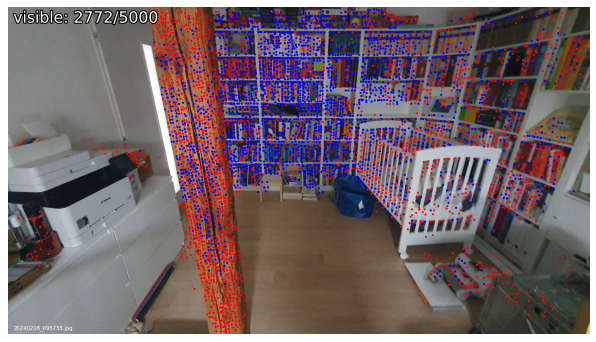

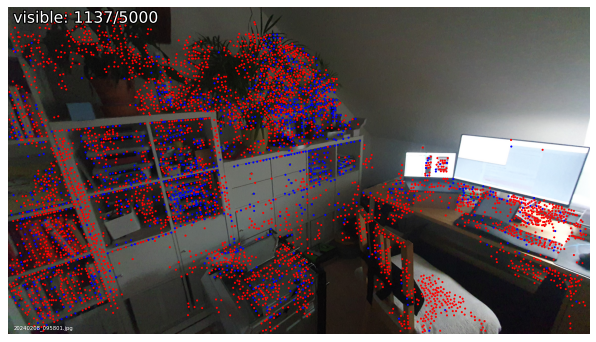

In [14]:
visualization.visualize_sfm_2d(model, images, color_by="visibility", n=5)

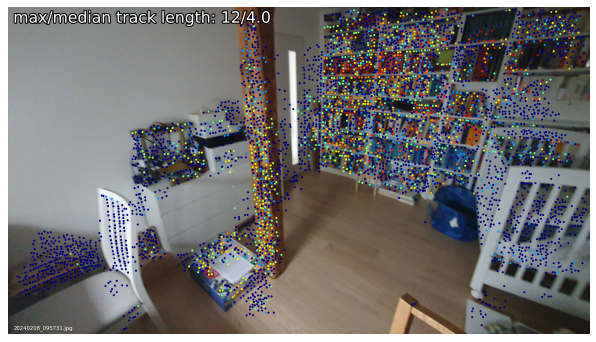

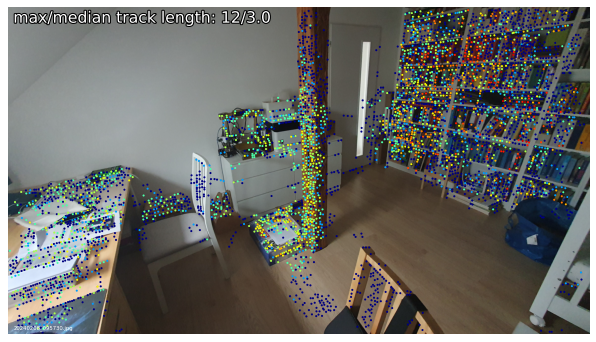

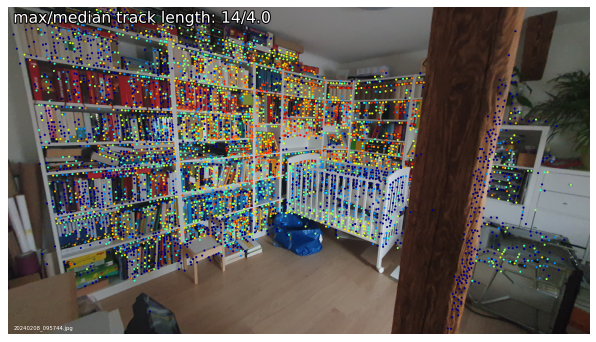

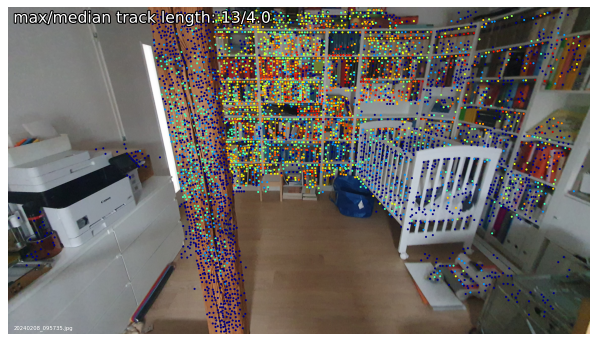

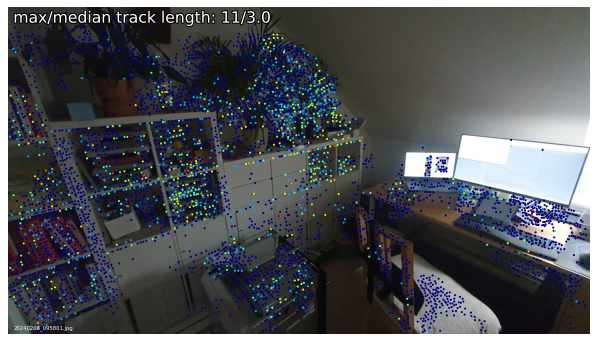

In [15]:
visualization.visualize_sfm_2d(model, images, color_by="track_length", n=5)

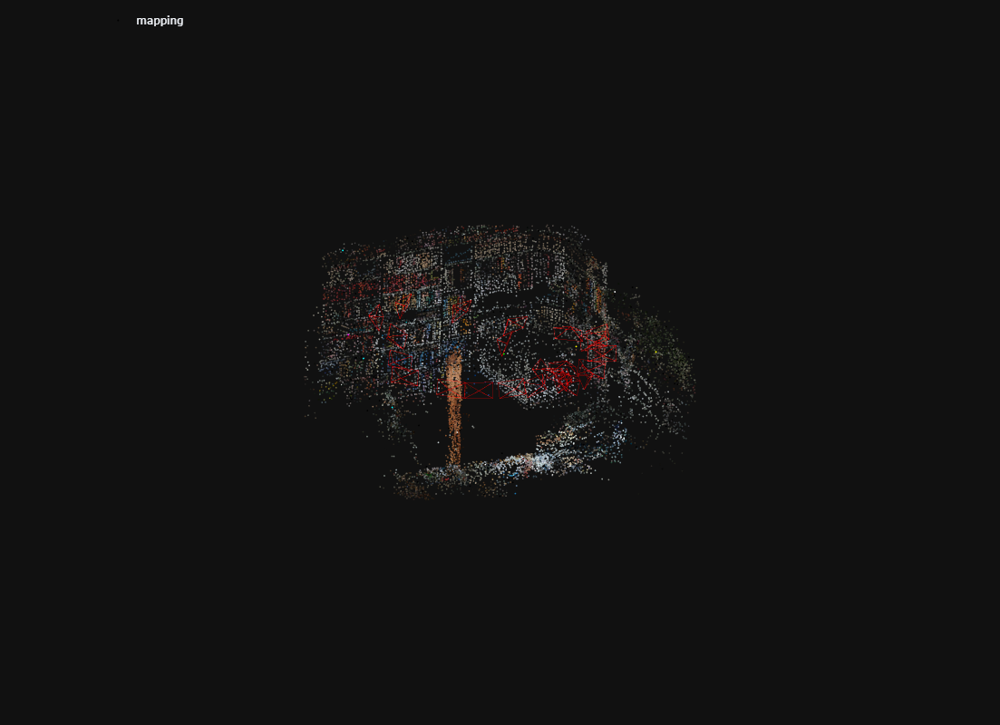

In [20]:
fig = viz_3d.init_figure()
viz_3d.plot_reconstruction(
    fig, model, color="rgba(255,0,0,0.5)", name="mapping", points_rgb=True
)
fig.show()